<a href="https://colab.research.google.com/github/Vhaatever/Electron-Microscopy-Segmentation/blob/main/3D_Segmentation_Transfer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install torchmetrics
!pip install segmentation_models_pytorch

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
#Utility libraries
import numpy as np
import random
import matplotlib.pyplot as plt
import copy
from os import path
from torchmetrics.classification import BinaryJaccardIndex
import random
from torch.utils.tensorboard import SummaryWriter


#Libraries for data preprocessing
import torch
from torchvision import transforms
import torchvision

#Libraries for Model building
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision.transforms.functional as TF
import segmentation_models_pytorch as smp


#Libraries for loading dataset
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import PIL
import os

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
os.chdir('/content/drive/MyDrive/seg')
device= torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
writer = SummaryWriter()

In [ ]:
#Loading the images (ground truth and test/train) 
testRaw=Image.open("testing.tif")
trainRaw=Image.open("training.tif")
trainGroundRaw=Image.open("training_groundtruth.tif")
testGroundRaw=Image.open("testing_groundtruth.tif")

In [ ]:
#Converting between .tiff file images to tensors which have more functionality
def convertToList(image):
  listImage=[]
  for i in range(image.n_frames):
    image.seek(i)
    imageFrame=torch.squeeze(TF.to_tensor(image))
    listImage.append(imageFrame)
  return listImage

In [ ]:
#Converting all the data to tensors
train=convertToList(trainRaw)
trainGround=convertToList(trainGroundRaw)
test=convertToList(testRaw)
testGround=convertToList(testGroundRaw)


In [ ]:
def extractSubVolume(image, dimension):
  length=dimension[1]
  width=dimension[2]
  depth=dimension[0]
  voxel=image[depth][length[0]:length[1],width[0]:width[1]]
  return voxel

In [ ]:
def extractVoxels(image,linspacing):
  dLength=linspacing[0]
  dWidth=linspacing[1]
  
  sDepth=len(image)
  sLength=len(image[0])
  sWidth=len(image[0][0])

  image_set=[]
  for depth in range(0, sDepth):
    for length in range(0, sLength, dLength):
      for width in range(0, sWidth, dWidth):
        if(length+dLength<sLength and width+dWidth<sWidth):
          #print(depth, length, width)
          dimension=[depth, [length,length+dLength],[width, width+dWidth]]
          image_set.append(extractSubVolume(image, dimension))
  return image_set

In [ ]:
#Extracting the input to the model as well as the model output in terms of subvolumes of size represented by dimensions
dimension=[512,512]
trainPre=extractVoxels(train, dimension)
trainGroundPre=extractVoxels(trainGround, dimension)
testSet=extractVoxels(test,dimension)
testSetGround=extractVoxels(testGround, dimension)

In [ ]:
#Dataset class to make the code modular along with transform functionality
class EleMic(Dataset):
  def __init__(self,image, target, transforms=None):
    self.transforms=transforms
    self.target=target
    self.image=image

  def __len__(self):
    return(len(self.image))

  def __getitem__(self, idx):
    image=self.image[idx]
    if self.transforms:
      image=self.transforms(image)
    target=self.target[idx]
    return (image.to(device), target.to(device))

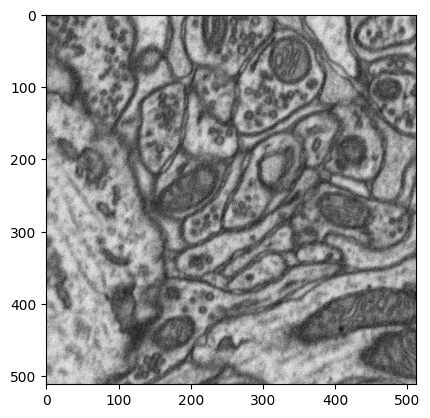

In [ ]:
i=random.randrange(0,len(trainPre))
plt.imshow(trainPre[i], cmap='gray')

In [ ]:
#Augmenting the data with more training inputs via abberations in the original image
def augmentDataset(set_train, set_ground, threshold, iter):
  final_train_data=copy.copy(set_train)
  final_set_ground=copy.copy(set_ground)
  i=0
  for image in set_train:
    if(image.count_nonzero()>threshold):
      final_train_data.append(TF.hflip(image))
      final_set_ground.append(TF.hflip(set_ground[i]))
      final_train_data.append(TF.vflip(image))
      final_set_ground.append(TF.vflip(set_ground[i]))
      final_train_data.append(torch.randn(image.shape)+image)
      final_set_ground.append(set_ground[i])
    i+=1
  return final_train_data, final_set_ground



In [ ]:
trainPre, trainGroundPre=augmentDataset(trainPre, trainGroundPre, threshold=0, iter=1)
temp = list(zip(trainPre, trainGroundPre))
random.shuffle(temp)
res1, res2 = zip(*temp)
# res1 and res2 come out as tuples, and so must be converted to lists.
trainPre, trainGroundPre = list(res1), list(res2)

valTestSplit=0.8
iter=1
valSet=trainPre[(int)(len(trainPre)*valTestSplit):]
valSetGround=trainGroundPre[(int)(len(trainGroundPre)*valTestSplit):]

trainSetGround=trainGroundPre[:(int)(len(trainPre)*valTestSplit)]
trainSet=trainPre[:(int)(len(trainPre)*valTestSplit)]


In [ ]:
dataTransforms={
    'train': None,
    'test': None
    ,'val':None
}

dataSets={
    'train': trainSet,
    'test': testSet
    , 'val': valSet
}
ground_cubes={
    'train': trainSetGround,
    'test': testSetGround
    ,'val': valSetGround
    
}

batchSize=16

In [ ]:
#Loading the datasets and the data loaders
dataSets= {x: EleMic(dataSets[x], ground_cubes[x], dataTransforms[x]) 
            for x in ['train', 'test', 'val']}

dataset_sizes = {x: len(dataSets[x]) for x in ['train', 'test','val']}

dataLoaders={x:torch.utils.data.DataLoader(dataSets[x], batch_size=batchSize,shuffle=True,drop_last=True)
              for x in ['train', 'test','val']}

print(dataset_sizes)

{'train': 528, 'test': 165, 'val': 132}


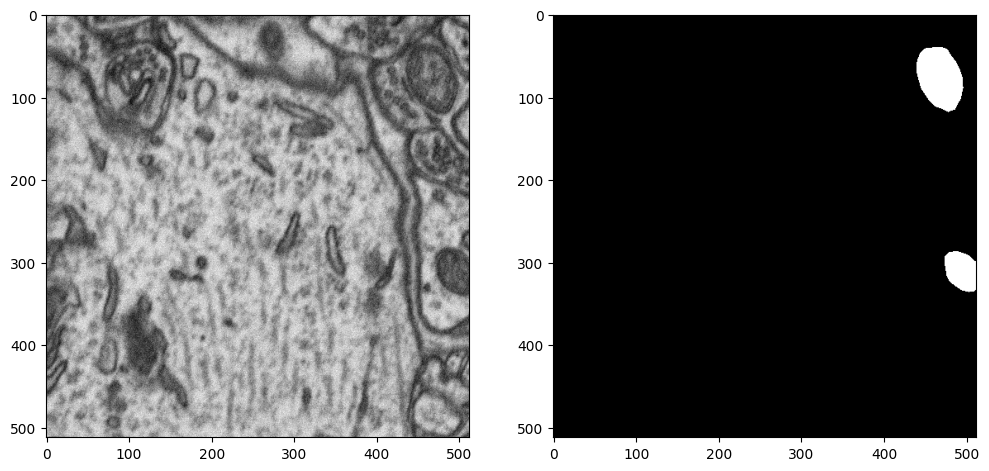

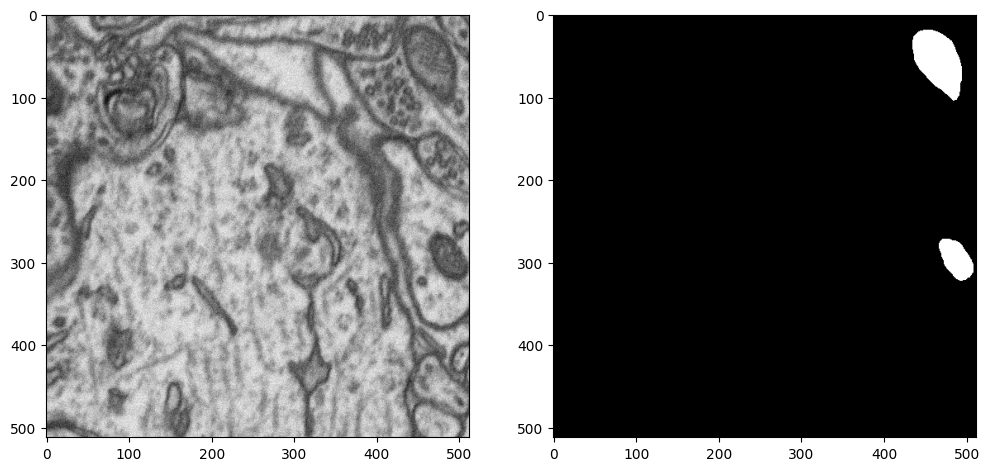

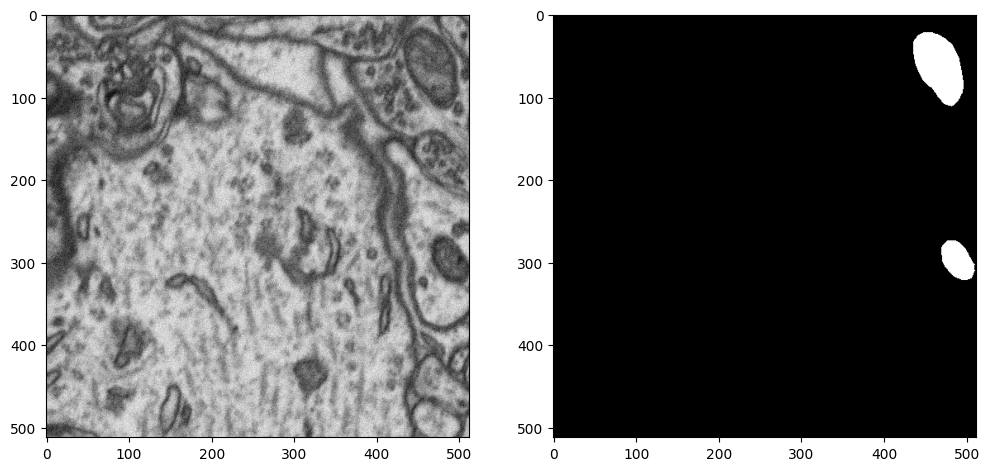

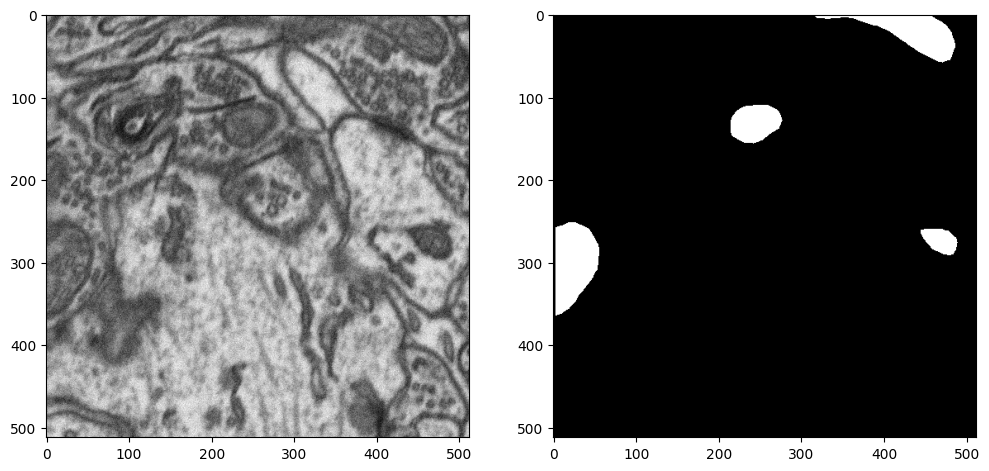

In [ ]:
for i in range (0,4):
  imageNumber = random.randint(0, len(testSet)-1)
  plt.figure(figsize=(12, 6))
  plt.subplot(121)
  plt.imshow((testSet[imageNumber]),cmap='gray')
  plt.subplot(122)
  plt.imshow((testSetGround[imageNumber]),cmap='gray')
  plt.show()

In [ ]:

model = smp.Unet(
    encoder_name="resnet34",        
    encoder_weights="imagenet",     
    in_channels=1,                 
    classes=1,                      
)

In [ ]:
class DiceBCELoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(DiceBCELoss, self).__init__()

    def forward(self, inputs, targets, smooth=1):
        
        #comment out if your model contains a sigmoid or equivalent activation layer
        inputs = nn.Sigmoid()(inputs)       
        
        #flatten label and prediction tensors
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        
        intersection = (inputs * targets).sum()                            
        dice_loss = 1 - (2.*intersection + smooth)/(inputs.sum() + targets.sum() + smooth)  
        BCE = F.binary_cross_entropy(inputs, targets, reduction='mean')
        Dice_BCE = BCE + dice_loss
        
        return Dice_BCE
loss=DiceBCELoss()

In [ ]:
learningRate=1e-4

In [ ]:
model.to(device) #migrating the model to cuda compatible if GPU server exists
optimizer=optim.Adam(model.parameters(), lr=learningRate, weight_decay=0.01)

Intermediate training sample


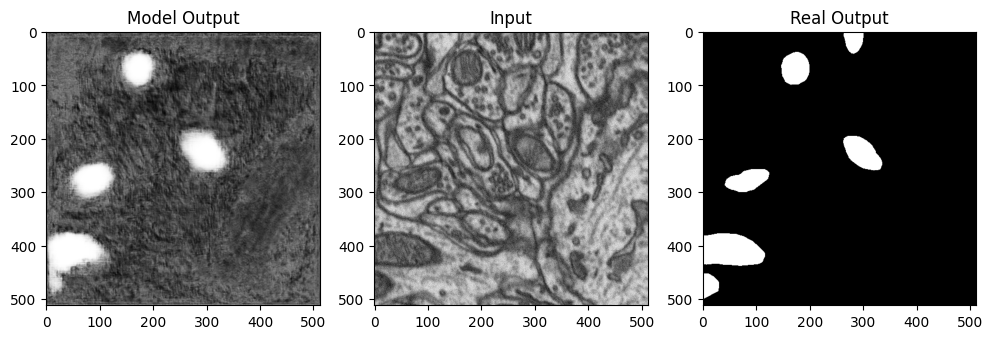

Intermediate validation sample


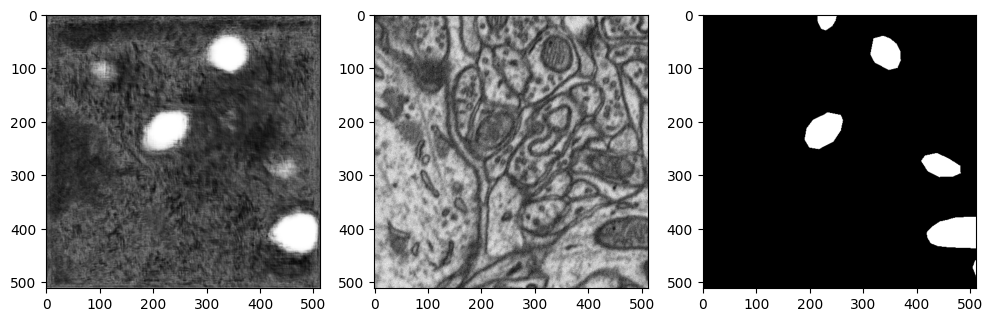

Epoch  0 : Train Loss 1.448192 with Jaccard Index/IoU 0.162040, Val loss 1.299010 with Jaccard Index/IoU 0.257324
Epoch  1 : Train Loss 1.135963 with Jaccard Index/IoU 0.471756, Val loss 1.057017 with Jaccard Index/IoU 0.529180
Epoch  2 : Train Loss 1.006061 with Jaccard Index/IoU 0.631972, Val loss 0.977554 with Jaccard Index/IoU 0.634072
Epoch  3 : Train Loss 0.921625 with Jaccard Index/IoU 0.697678, Val loss 0.917219 with Jaccard Index/IoU 0.728379
Epoch  4 : Train Loss 0.847634 with Jaccard Index/IoU 0.748762, Val loss 0.854915 with Jaccard Index/IoU 0.765089
Intermediate training sample


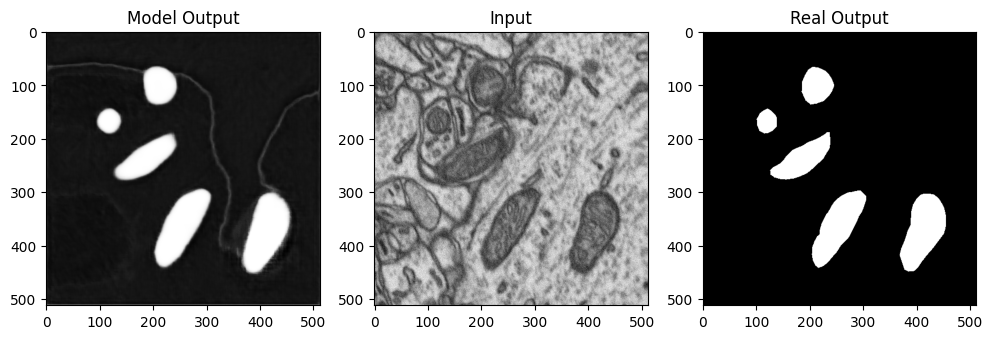

Intermediate validation sample


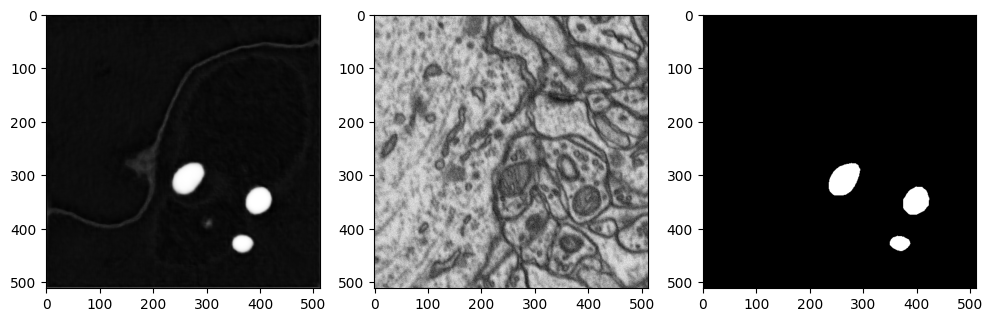

Epoch  5 : Train Loss 0.781988 with Jaccard Index/IoU 0.777866, Val loss 0.808562 with Jaccard Index/IoU 0.728429
Epoch  6 : Train Loss 0.718224 with Jaccard Index/IoU 0.808576, Val loss 0.791064 with Jaccard Index/IoU 0.692869
Epoch  7 : Train Loss 0.672593 with Jaccard Index/IoU 0.802152, Val loss 0.773532 with Jaccard Index/IoU 0.593672
Epoch  8 : Train Loss 0.613836 with Jaccard Index/IoU 0.818680, Val loss 0.647783 with Jaccard Index/IoU 0.757008
Epoch  9 : Train Loss 0.558229 with Jaccard Index/IoU 0.830830, Val loss 0.618207 with Jaccard Index/IoU 0.755845
Intermediate training sample


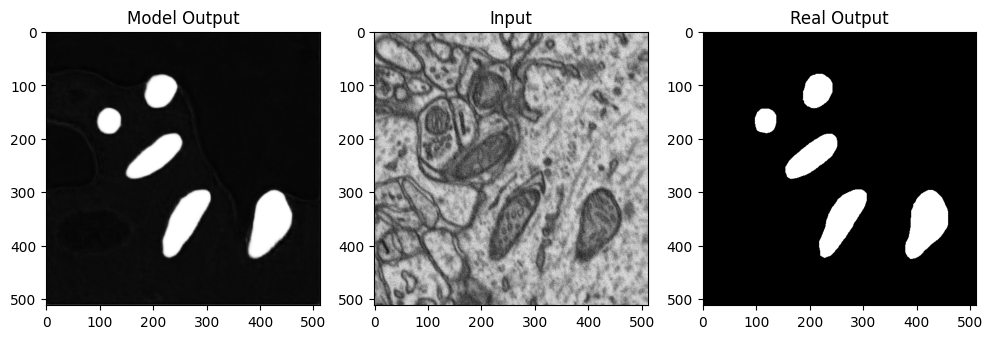

Intermediate validation sample


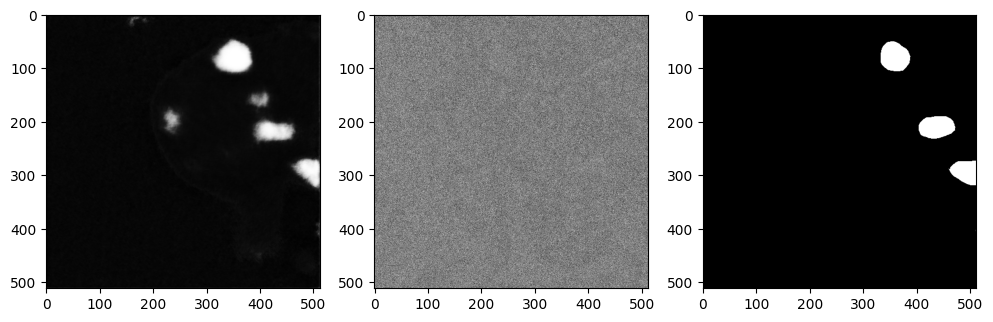

Epoch 10 : Train Loss 0.509449 with Jaccard Index/IoU 0.834112, Val loss 0.532694 with Jaccard Index/IoU 0.814570
Epoch 11 : Train Loss 0.453433 with Jaccard Index/IoU 0.861462, Val loss 0.481669 with Jaccard Index/IoU 0.821576
Epoch 12 : Train Loss 0.417719 with Jaccard Index/IoU 0.857283, Val loss 0.469237 with Jaccard Index/IoU 0.773573
Epoch 13 : Train Loss 0.379004 with Jaccard Index/IoU 0.860386, Val loss 0.414162 with Jaccard Index/IoU 0.818563
Epoch 14 : Train Loss 0.334677 with Jaccard Index/IoU 0.875892, Val loss 0.384610 with Jaccard Index/IoU 0.819805
Intermediate training sample


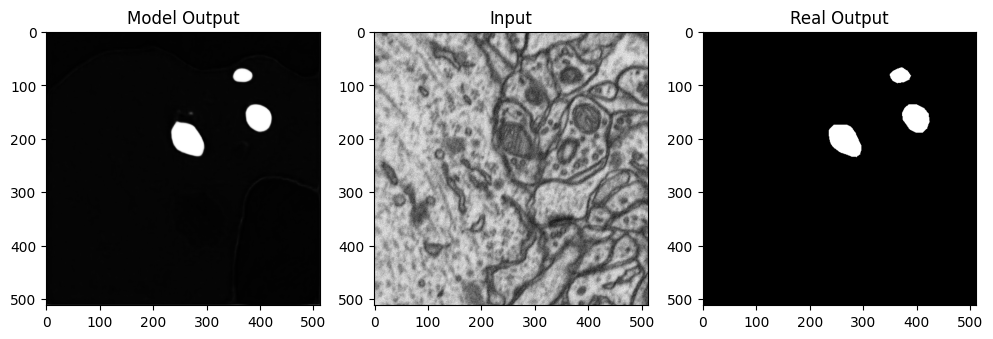

Intermediate validation sample


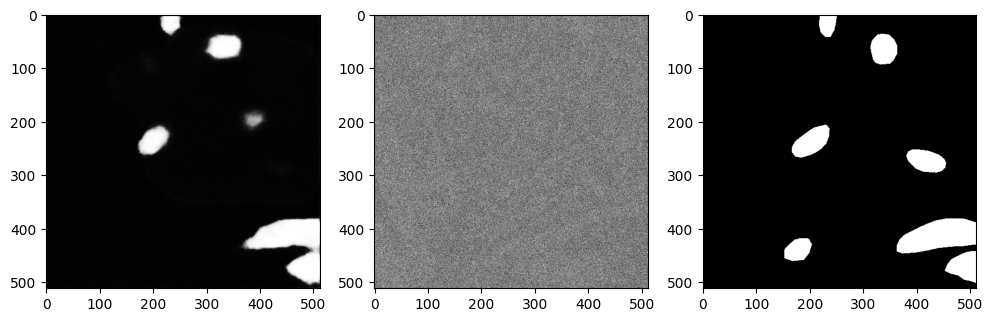

Epoch 15 : Train Loss 0.305353 with Jaccard Index/IoU 0.878356, Val loss 0.353021 with Jaccard Index/IoU 0.815133
Epoch 16 : Train Loss 0.281726 with Jaccard Index/IoU 0.875169, Val loss 0.354954 with Jaccard Index/IoU 0.784776
Epoch 17 : Train Loss 0.291538 with Jaccard Index/IoU 0.835996, Val loss 0.420440 with Jaccard Index/IoU 0.695400
Epoch 18 : Train Loss 0.260977 with Jaccard Index/IoU 0.852498, Val loss 0.272649 with Jaccard Index/IoU 0.840415
Epoch 19 : Train Loss 0.222946 with Jaccard Index/IoU 0.885091, Val loss 0.254518 with Jaccard Index/IoU 0.857808
Intermediate training sample


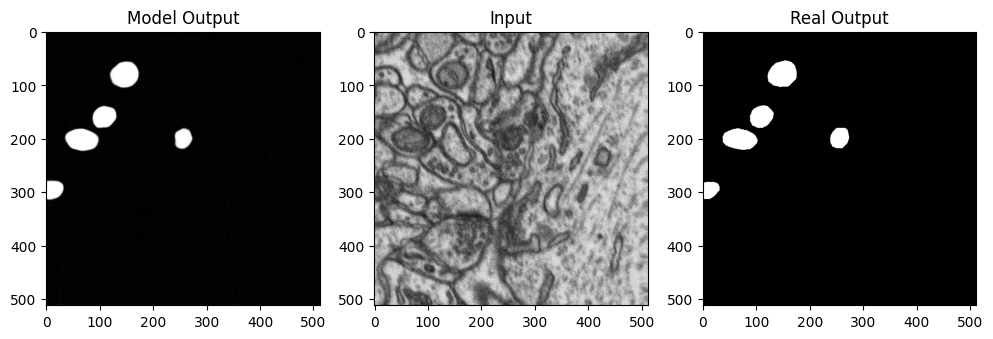

Intermediate validation sample


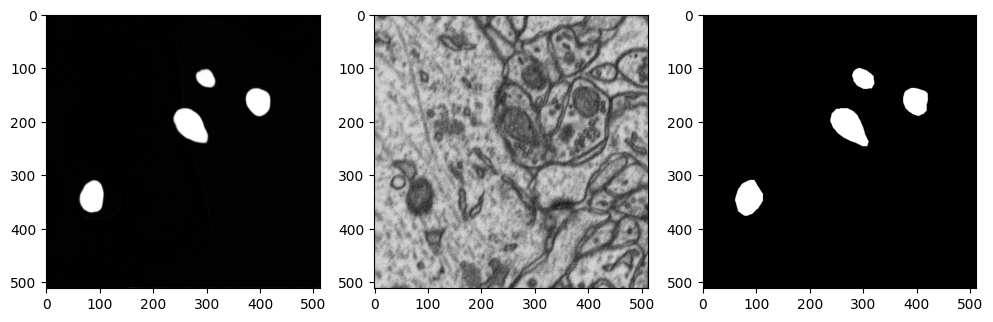

Epoch 20 : Train Loss 0.207599 with Jaccard Index/IoU 0.887923, Val loss 0.261437 with Jaccard Index/IoU 0.822767
Epoch 21 : Train Loss 0.191313 with Jaccard Index/IoU 0.894289, Val loss 0.283816 with Jaccard Index/IoU 0.785000
Epoch 22 : Train Loss 0.183999 with Jaccard Index/IoU 0.889833, Val loss 0.244605 with Jaccard Index/IoU 0.822077
Epoch 23 : Train Loss 0.185236 with Jaccard Index/IoU 0.876516, Val loss 0.249697 with Jaccard Index/IoU 0.805953
Epoch 24 : Train Loss 0.174165 with Jaccard Index/IoU 0.880320, Val loss 0.205595 with Jaccard Index/IoU 0.847785
Intermediate training sample


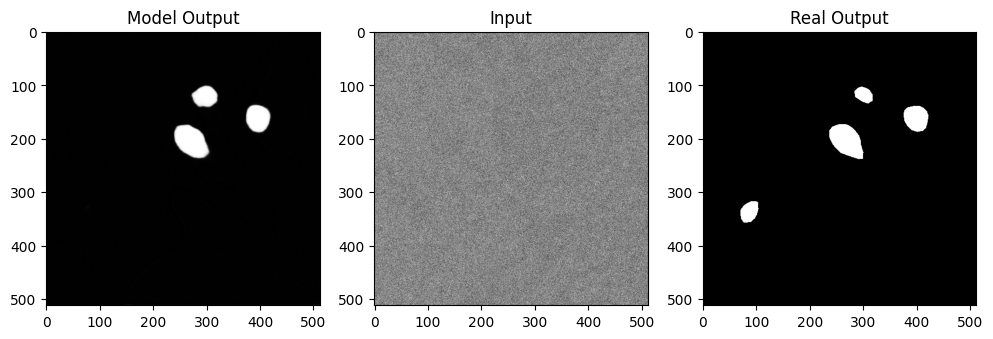

Intermediate validation sample


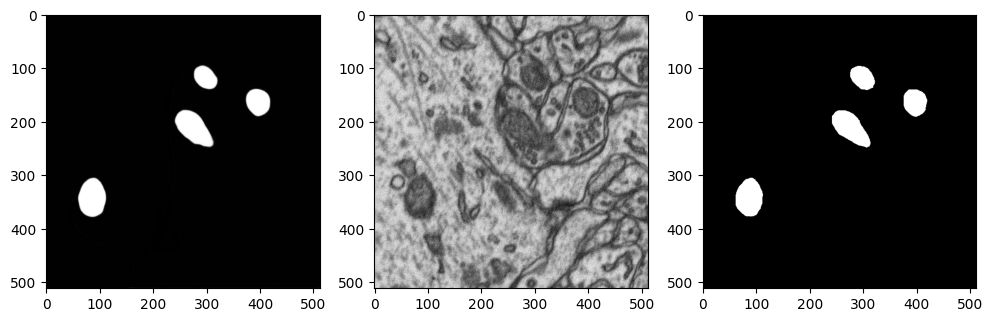

Epoch 25 : Train Loss 0.152184 with Jaccard Index/IoU 0.900949, Val loss 0.220087 with Jaccard Index/IoU 0.825188
Epoch 26 : Train Loss 0.154975 with Jaccard Index/IoU 0.889424, Val loss 0.230788 with Jaccard Index/IoU 0.795294
Epoch 27 : Train Loss 0.152673 with Jaccard Index/IoU 0.886581, Val loss 0.186274 with Jaccard Index/IoU 0.851646
Epoch 28 : Train Loss 0.134969 with Jaccard Index/IoU 0.901617, Val loss 0.190138 with Jaccard Index/IoU 0.839151
Epoch 29 : Train Loss 0.126793 with Jaccard Index/IoU 0.907568, Val loss 0.159719 with Jaccard Index/IoU 0.870706
Intermediate training sample


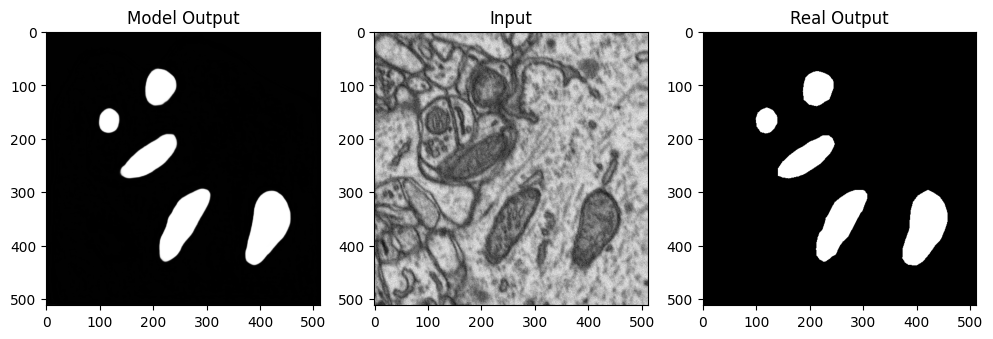

Intermediate validation sample


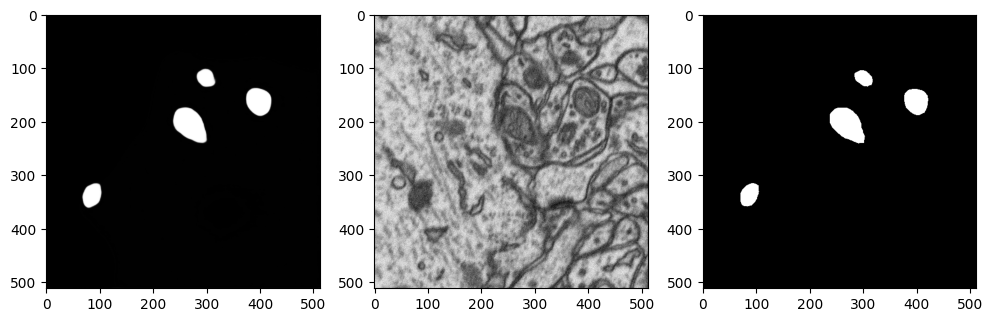

Epoch 30 : Train Loss 0.115935 with Jaccard Index/IoU 0.916491, Val loss 0.158760 with Jaccard Index/IoU 0.866942
Epoch 31 : Train Loss 0.113749 with Jaccard Index/IoU 0.913962, Val loss 0.148624 with Jaccard Index/IoU 0.873531
Epoch 32 : Train Loss 0.119221 with Jaccard Index/IoU 0.904436, Val loss 0.487697 with Jaccard Index/IoU 0.528671
Epoch 33 : Train Loss 0.166158 with Jaccard Index/IoU 0.842236, Val loss 0.178663 with Jaccard Index/IoU 0.840261
Epoch 34 : Train Loss 0.128418 with Jaccard Index/IoU 0.884524, Val loss 0.170267 with Jaccard Index/IoU 0.837546
Intermediate training sample


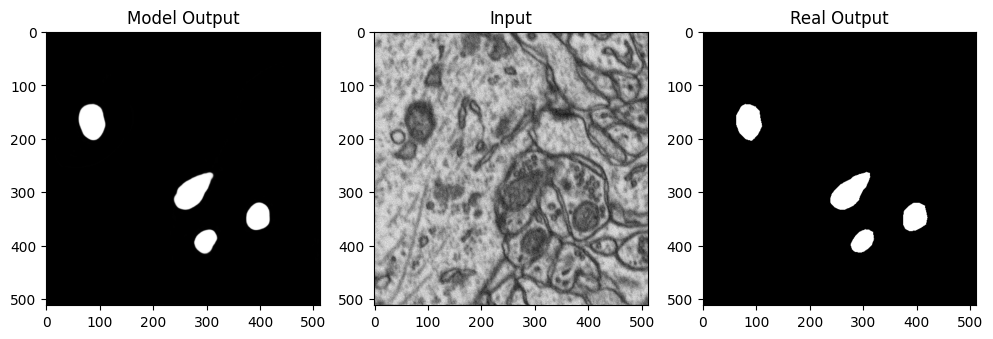

Intermediate validation sample


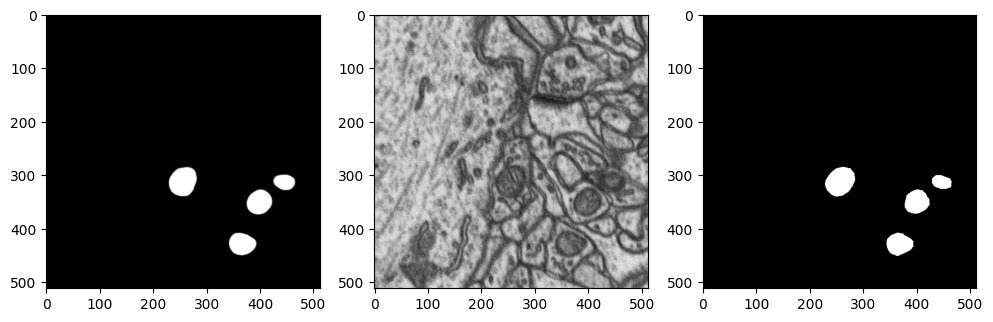

Epoch 35 : Train Loss 0.110293 with Jaccard Index/IoU 0.904485, Val loss 0.133465 with Jaccard Index/IoU 0.878248
Epoch 36 : Train Loss 0.102698 with Jaccard Index/IoU 0.911518, Val loss 0.133715 with Jaccard Index/IoU 0.875619
Epoch 37 : Train Loss 0.098382 with Jaccard Index/IoU 0.915073, Val loss 0.126053 with Jaccard Index/IoU 0.881650
Epoch 38 : Train Loss 0.095941 with Jaccard Index/IoU 0.915607, Val loss 0.135086 with Jaccard Index/IoU 0.869202
Epoch 39 : Train Loss 0.128590 with Jaccard Index/IoU 0.873506, Val loss 0.230430 with Jaccard Index/IoU 0.746216
Intermediate training sample


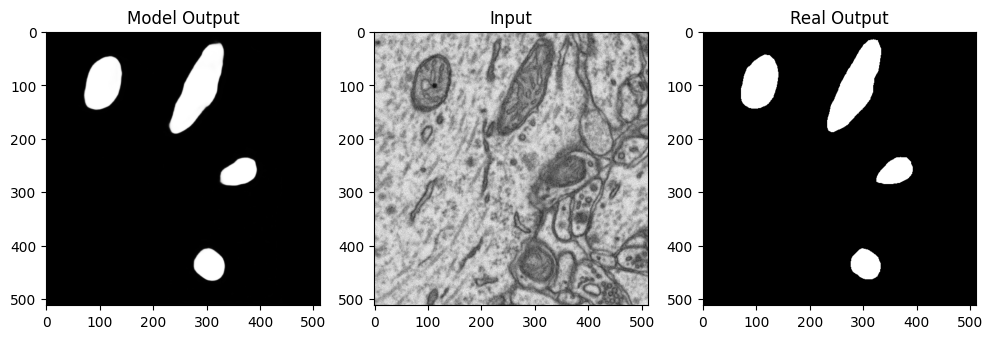

Intermediate validation sample


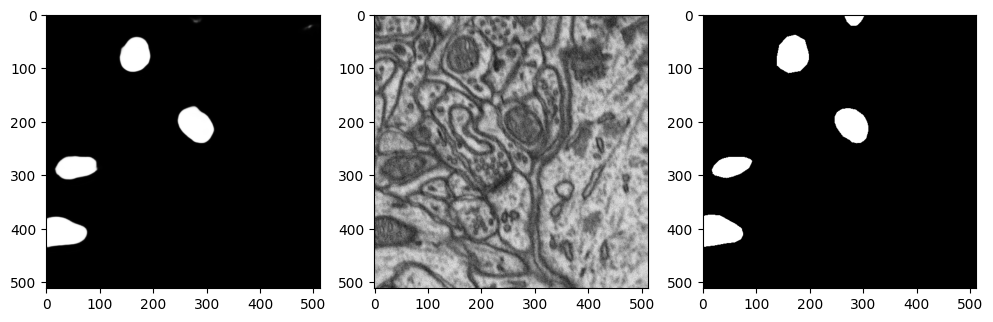

Epoch 40 : Train Loss 0.125031 with Jaccard Index/IoU 0.876255, Val loss 0.176725 with Jaccard Index/IoU 0.815975
Epoch 41 : Train Loss 0.110779 with Jaccard Index/IoU 0.892203, Val loss 0.135462 with Jaccard Index/IoU 0.871437
Epoch 42 : Train Loss 0.094074 with Jaccard Index/IoU 0.910752, Val loss 0.146860 with Jaccard Index/IoU 0.845629
Epoch 43 : Train Loss 0.087928 with Jaccard Index/IoU 0.916927, Val loss 0.121837 with Jaccard Index/IoU 0.878205
Epoch 44 : Train Loss 0.085610 with Jaccard Index/IoU 0.918515, Val loss 0.117927 with Jaccard Index/IoU 0.877765
Intermediate training sample


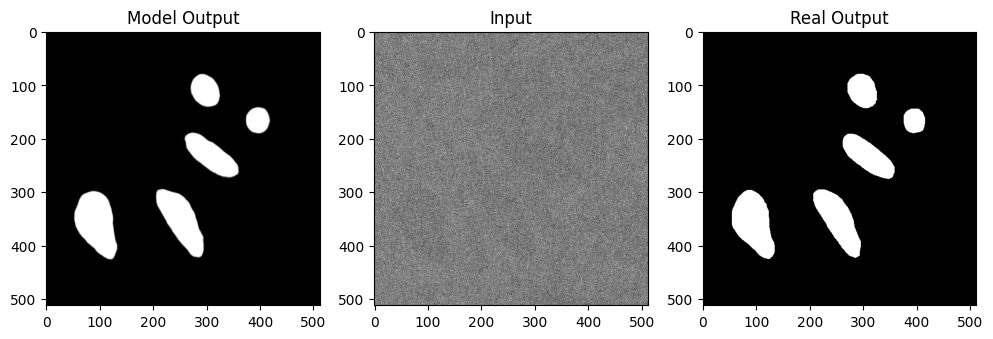

Intermediate validation sample


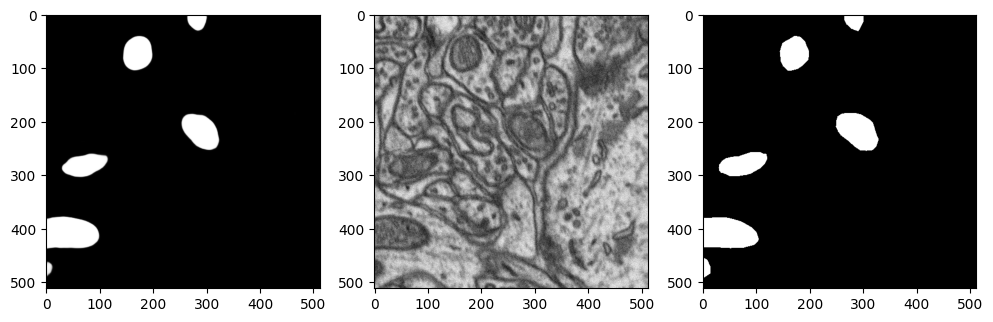

Epoch 45 : Train Loss 0.081412 with Jaccard Index/IoU 0.922493, Val loss 0.116092 with Jaccard Index/IoU 0.880613
Epoch 46 : Train Loss 0.076719 with Jaccard Index/IoU 0.927542, Val loss 0.112286 with Jaccard Index/IoU 0.884246
Epoch 47 : Train Loss 0.072940 with Jaccard Index/IoU 0.931210, Val loss 0.111496 with Jaccard Index/IoU 0.883015
Epoch 48 : Train Loss 0.071220 with Jaccard Index/IoU 0.932333, Val loss 0.108194 with Jaccard Index/IoU 0.887601
Epoch 49 : Train Loss 0.069756 with Jaccard Index/IoU 0.933247, Val loss 0.118484 with Jaccard Index/IoU 0.873974
Intermediate training sample


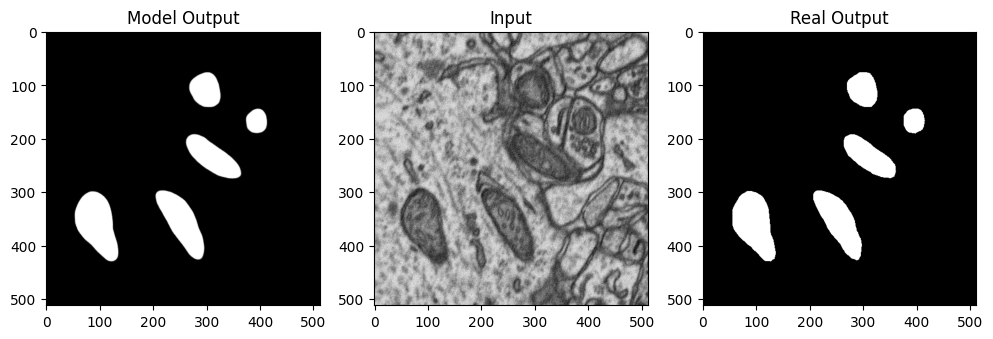

Intermediate validation sample


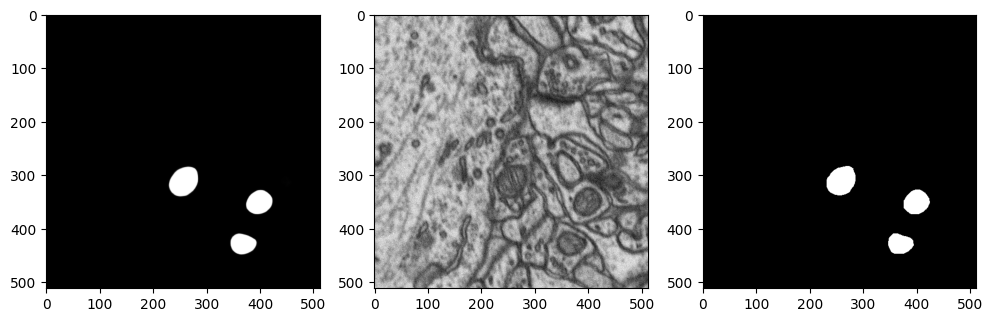

Epoch 50 : Train Loss 0.070948 with Jaccard Index/IoU 0.930612, Val loss 0.114476 with Jaccard Index/IoU 0.874307
Epoch 51 : Train Loss 0.067987 with Jaccard Index/IoU 0.933559, Val loss 0.107277 with Jaccard Index/IoU 0.883243
Epoch 52 : Train Loss 0.067463 with Jaccard Index/IoU 0.933245, Val loss 0.113184 with Jaccard Index/IoU 0.878670
Epoch 53 : Train Loss 0.064552 with Jaccard Index/IoU 0.936617, Val loss 0.127476 with Jaccard Index/IoU 0.860332
Epoch 54 : Train Loss 0.065867 with Jaccard Index/IoU 0.934052, Val loss 0.123005 with Jaccard Index/IoU 0.861752
Intermediate training sample


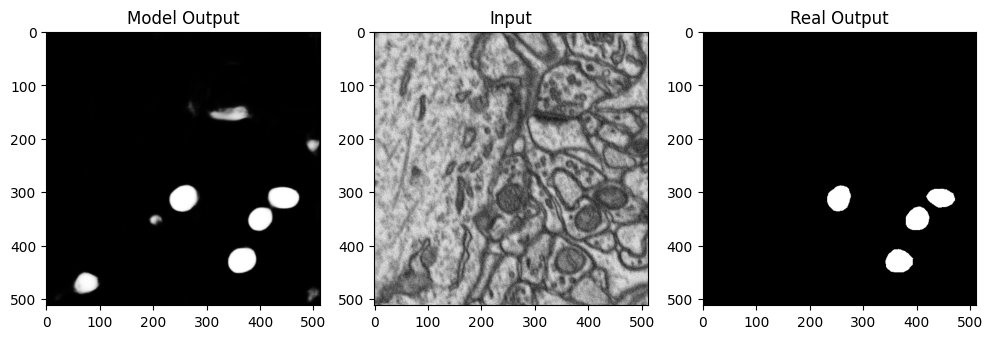

Intermediate validation sample


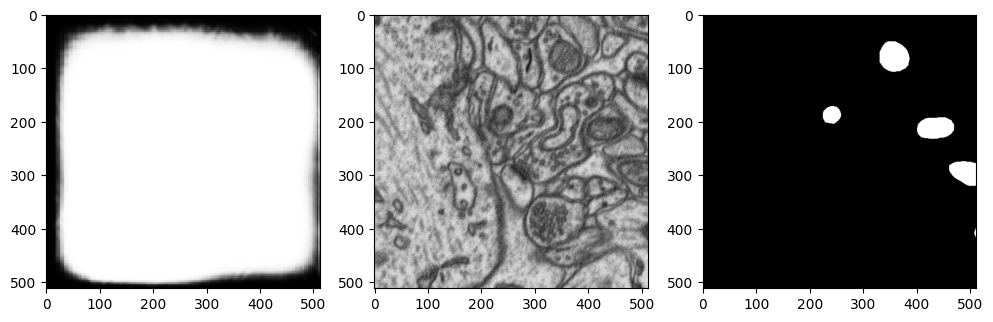

Epoch 55 : Train Loss 0.216627 with Jaccard Index/IoU 0.770583, Val loss 14.565410 with Jaccard Index/IoU 0.051951
Epoch 56 : Train Loss 0.211516 with Jaccard Index/IoU 0.766050, Val loss 0.188919 with Jaccard Index/IoU 0.799804
Epoch 57 : Train Loss 0.126700 with Jaccard Index/IoU 0.857668, Val loss 0.162233 with Jaccard Index/IoU 0.817696
Epoch 58 : Train Loss 0.103555 with Jaccard Index/IoU 0.883920, Val loss 0.128718 with Jaccard Index/IoU 0.854377
Epoch 59 : Train Loss 0.093599 with Jaccard Index/IoU 0.896036, Val loss 0.117210 with Jaccard Index/IoU 0.865807
Intermediate training sample


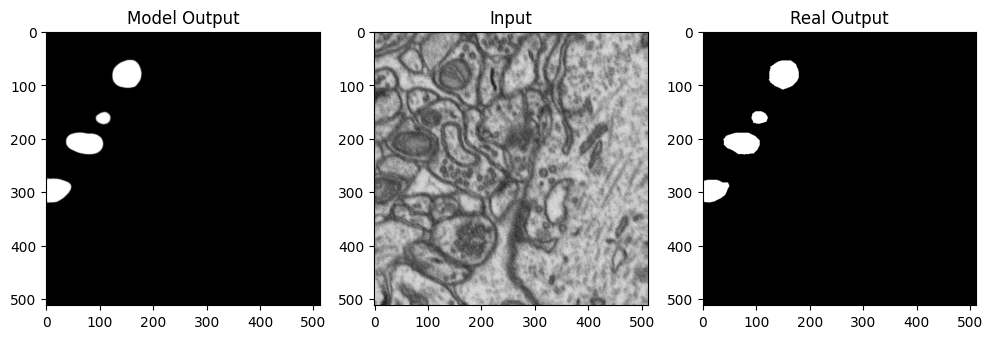

Intermediate validation sample


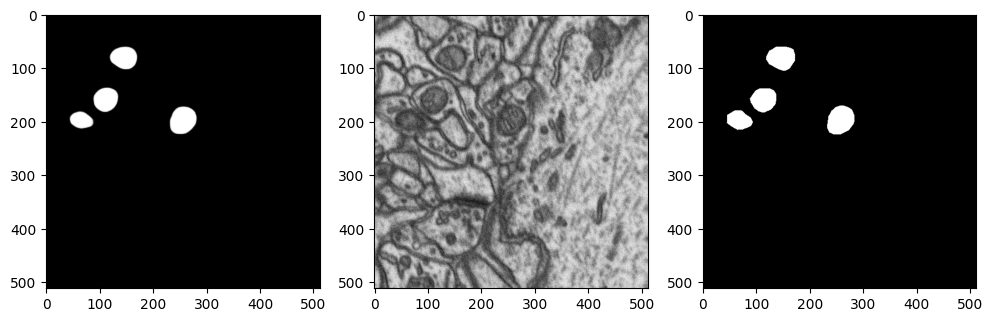

Epoch 60 : Train Loss 0.084010 with Jaccard Index/IoU 0.907021, Val loss 0.113177 with Jaccard Index/IoU 0.871623
Epoch 61 : Train Loss 0.078521 with Jaccard Index/IoU 0.913751, Val loss 0.102837 with Jaccard Index/IoU 0.881586
Epoch 62 : Train Loss 0.072081 with Jaccard Index/IoU 0.921398, Val loss 0.100925 with Jaccard Index/IoU 0.886380
Epoch 63 : Train Loss 0.068668 with Jaccard Index/IoU 0.925454, Val loss 0.103566 with Jaccard Index/IoU 0.881532
Epoch 64 : Train Loss 0.070968 with Jaccard Index/IoU 0.922341, Val loss 0.145988 with Jaccard Index/IoU 0.832556
Intermediate training sample


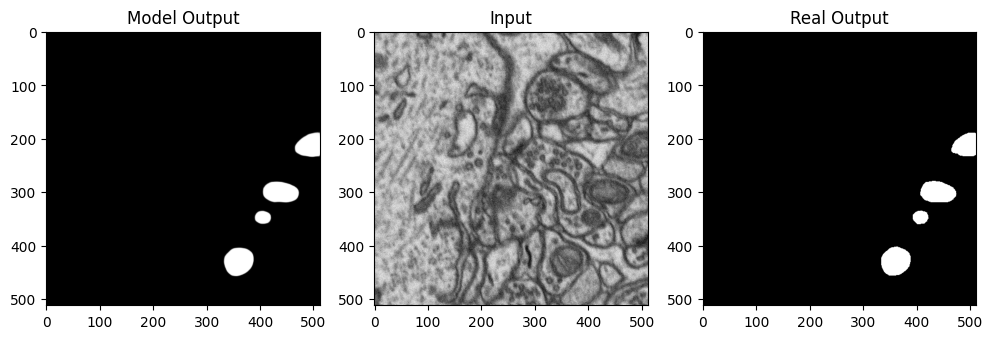

Intermediate validation sample


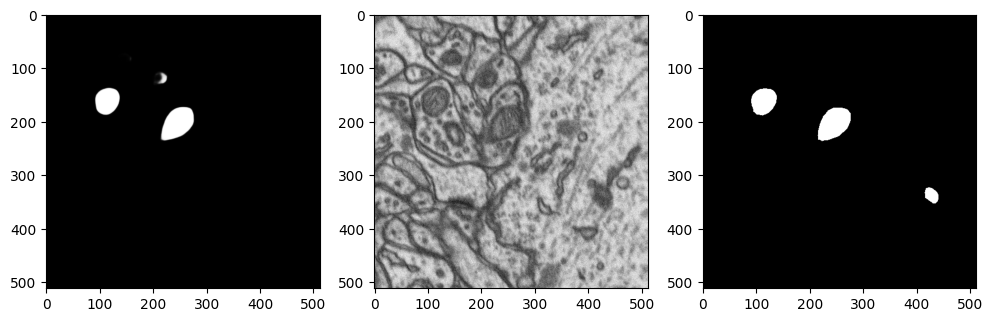

Epoch 65 : Train Loss 0.070210 with Jaccard Index/IoU 0.922490, Val loss 0.105500 with Jaccard Index/IoU 0.879750
Epoch 66 : Train Loss 0.066350 with Jaccard Index/IoU 0.927337, Val loss 0.104088 with Jaccard Index/IoU 0.879851
Epoch 67 : Train Loss 0.079375 with Jaccard Index/IoU 0.910239, Val loss 0.156949 with Jaccard Index/IoU 0.817588
Epoch 68 : Train Loss 0.076142 with Jaccard Index/IoU 0.913757, Val loss 0.102488 with Jaccard Index/IoU 0.878762
Epoch 69 : Train Loss 0.067076 with Jaccard Index/IoU 0.924967, Val loss 0.099090 with Jaccard Index/IoU 0.885361


In [ ]:
#training loop
numEpochs=70

tlossPerEpoch=[]
vlossPerEpoch=[]
tIndexPerEpoch=[]
vIndexPerEpoch=[]

metric = BinaryJaccardIndex()

for epoch in range(numEpochs):
  epoch_loss=0
  model.train()
  btc=[]
  for idx, batch in enumerate(dataLoaders['train']):
    optimizer.zero_grad()
    #clearing out the previous gradient calculations
    #migrating the code to cuda device if GPU servers are present
    imgInput=batch[0].to(device)
    imgTarget=batch[1].to(device)
    
    #Images input into the model
    imgInput=torch.unsqueeze(imgInput,1)
    outputs=model(imgInput)
    imgTarget=torch.unsqueeze(imgTarget,1)
    #print("Target", idx, imgTarget.count_nonzero())
    batchLoss=loss(outputs, imgTarget)
    
    #Updating the weights
    batchLoss.backward()  
    optimizer.step()
    #scheduler.step()
    
    #loss updates
    epoch_loss+=batchLoss.detach()
    btc.append(metric(((nn.Sigmoid()(outputs).cpu())), imgTarget.cpu()))
 
        
    
  tlossPerEpoch.append(epoch_loss.item()/len(dataLoaders['train']))
  tIndexPerEpoch.append(np.mean(btc))
  #writer.add_scalar("Loss/train/", epoch_loss, epoch,np.mean(btc))
  
  btc=[]
  valLoss=0
  with torch.no_grad():
	# set the model in evaluation mode
    model.eval()
  # loop over the validation set
    for idx, batch in enumerate(dataLoaders['val']):
    # send the input to the device
      x=batch[0].to(device)
      y=batch[1].to(device)
      # make the predictions and calculate the validation loss
      x=torch.unsqueeze(x,1)
      pred = model(x)
      y=torch.unsqueeze(y,1)
      valLoss += loss(pred, y).detach()
      btc.append(metric(((nn.Sigmoid()(pred).cpu())), y.cpu()))        
  vlossPerEpoch.append(valLoss.item()/len(dataLoaders['val']))
  vIndexPerEpoch.append(np.mean(btc))

  #the logging/saving of training attributes and losses
  writer.add_scalar("Loss/val/", valLoss, epoch, np.mean(btc))

  if(epoch%5==0):
    pathToSave=os.path.join(os.getcwd(),'ResUnet','learningRate'+str(learningRate),str(batchSize),str(epoch))
    if path.exists(pathToSave) == False:
      os.makedirs(pathToSave)
    torch.save(model.state_dict(), pathToSave+".pth") 
    #torch.save(tlossPerEpoch, pathToSave)
    with torch.no_grad():
    # set the model in evaluation mode
      model.eval()
      print("Intermediate training sample")
      plt.figure(figsize=(12, 6))
      plt.subplot(131)
      plt.imshow((nn.Sigmoid()(outputs[0][0])).cpu().float(), cmap='gray')
      plt.title("Model Output")
      plt.subplot(132)
      plt.imshow(imgInput[0][0].cpu(), cmap='gray')
      plt.title("Input")
      plt.subplot(133)
      plt.imshow(imgTarget[0][0].cpu(), cmap='gray')
      plt.title("Real Output")
      plt.show()

      print("Intermediate validation sample")
      plt.figure(figsize=(12, 6))
      plt.subplot(131)
      plt.imshow((nn.Sigmoid()(pred[0][0])).cpu().float(),cmap='gray')
      plt.subplot(132)
      plt.imshow(x[0][0].cpu(), cmap='gray')
      plt.subplot(133)
      plt.imshow(y[0][0].cpu(), cmap='gray')
      plt.show()
  #printing the epochs  
  print("Epoch %2i : Train Loss %f with Jaccard Index/IoU %f, Val loss %f with Jaccard Index/IoU %f" % (
      epoch, tlossPerEpoch[-1], np.mean(tIndexPerEpoch[-1]),vlossPerEpoch[-1], np.mean(vIndexPerEpoch[-1])))
writer.flush()

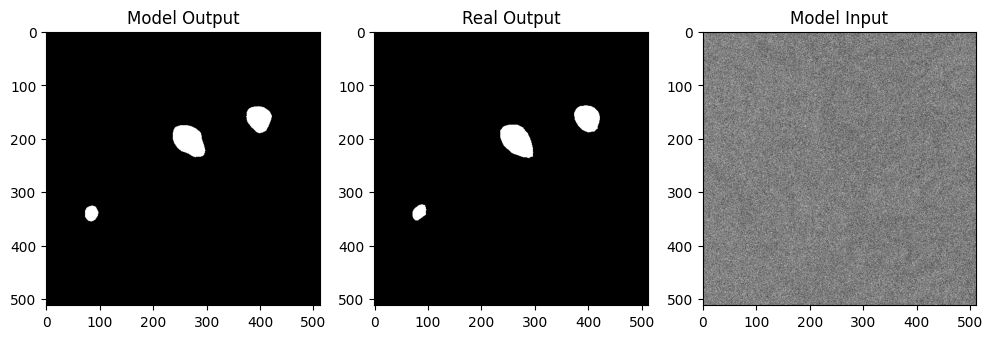

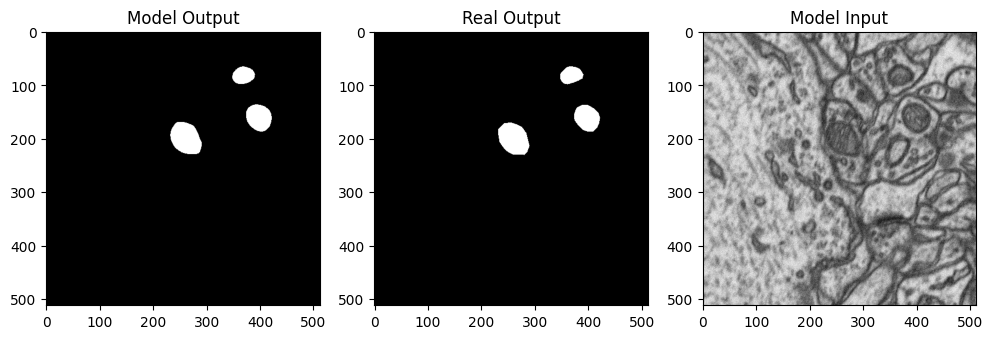

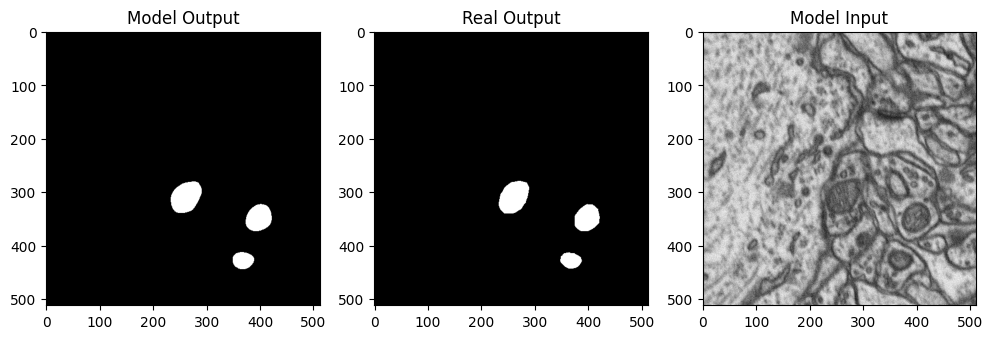

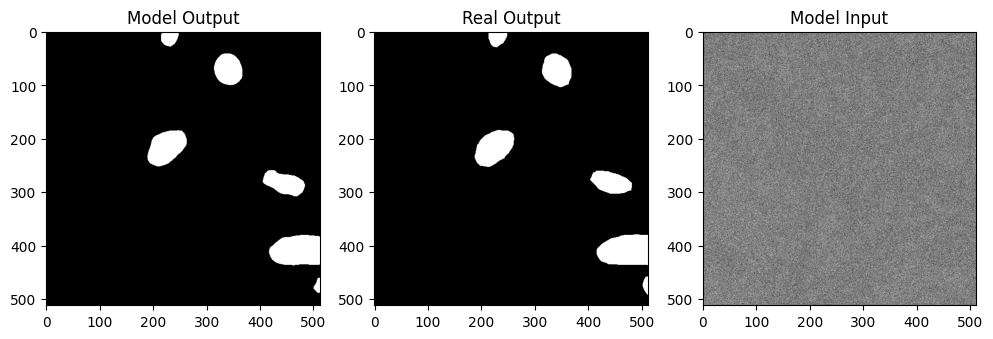

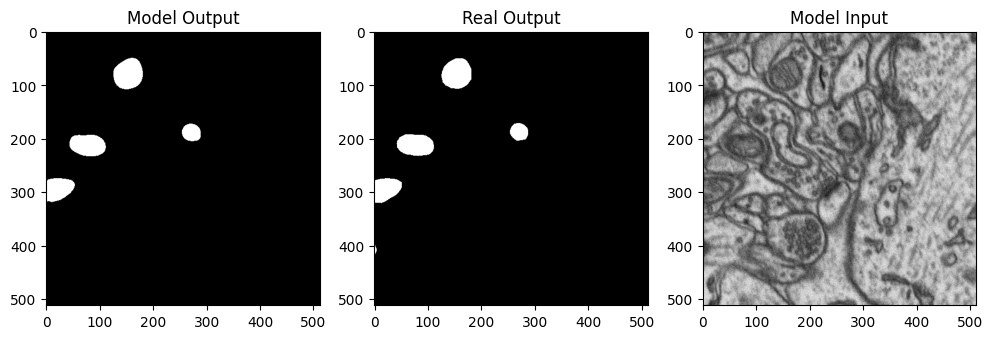

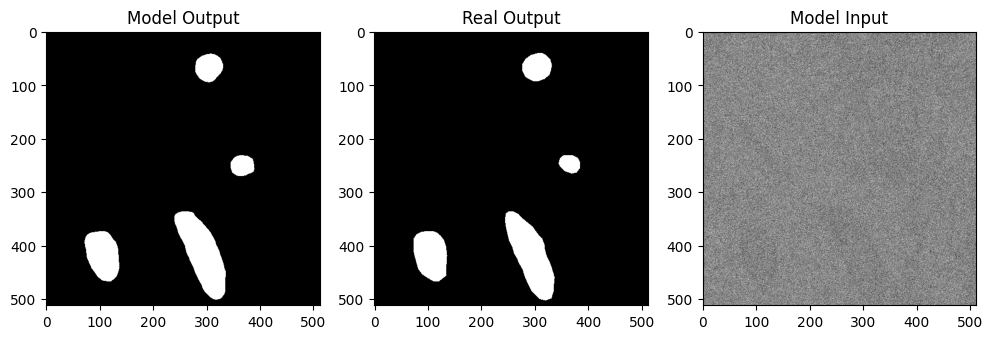

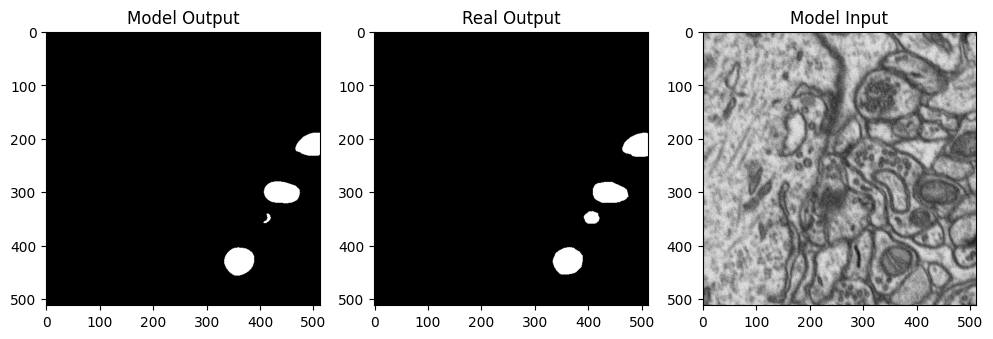

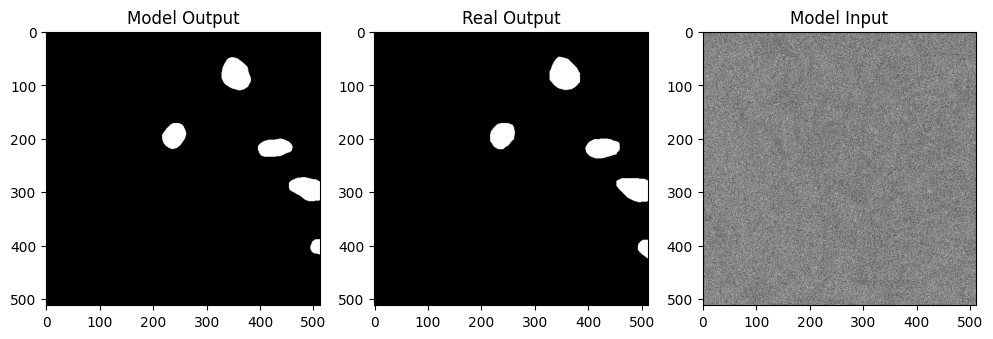

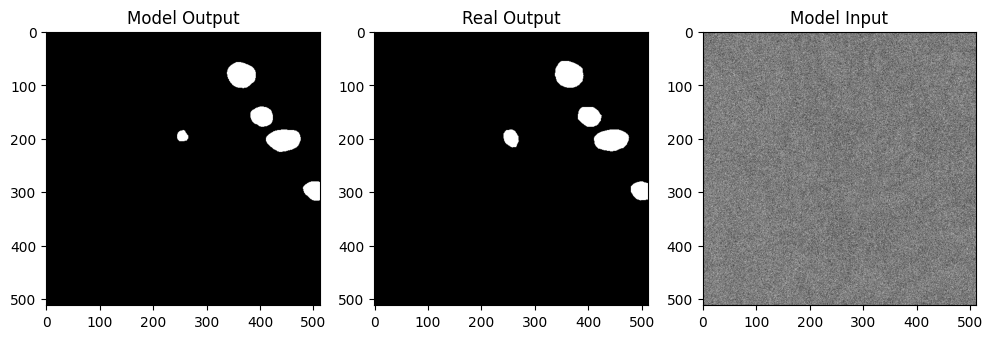

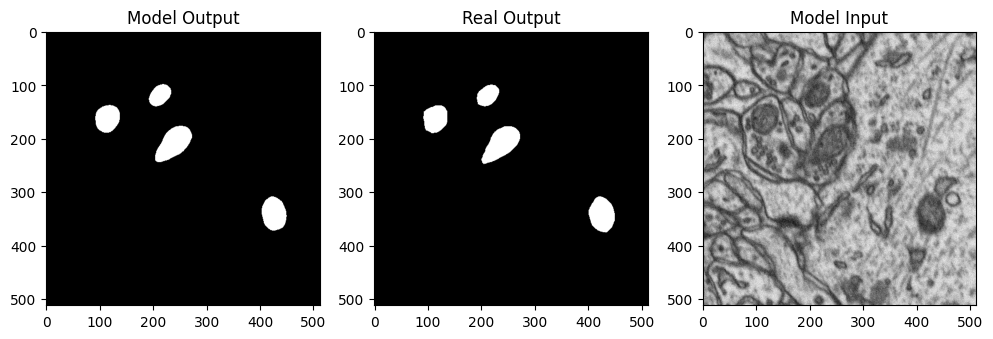

In [ ]:
with torch.no_grad():
# set the model in evaluation mode
  model.eval()
# loop over the validation set
  for idx, batch in enumerate(dataLoaders['train']):
  # send the input to the device
    if(idx<10):
      (x, y) = (batch[0].to(device), batch[1].to(device))

      # make the predictions and calculate the validation loss
      pred = nn.Sigmoid()(model(torch.unsqueeze(x,1)))
      plt.figure(figsize=(12, 6))
      plt.subplot(131)
      plt.title("Model Output")      
      plt.imshow(((pred[0][0])).cpu().float()>0.5,cmap='gray')
      plt.subplot(132)
      plt.title("Real Output")
      plt.imshow(y[0].cpu(), cmap='gray')
      plt.subplot(133)
      plt.title("Model Input")
      plt.imshow(x[0].cpu(), cmap='gray')
      plt.show()
    
    #print(pred)
   
    #btcn.append(metric(pred.cpu(), torch.unsqueeze(y,1).cpu()))


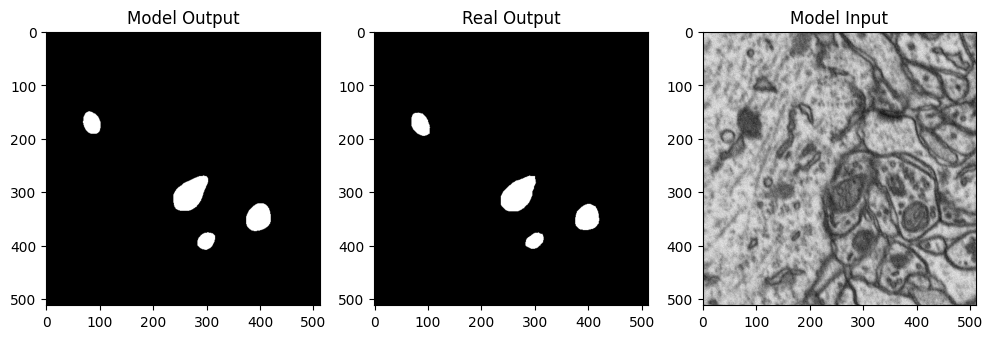

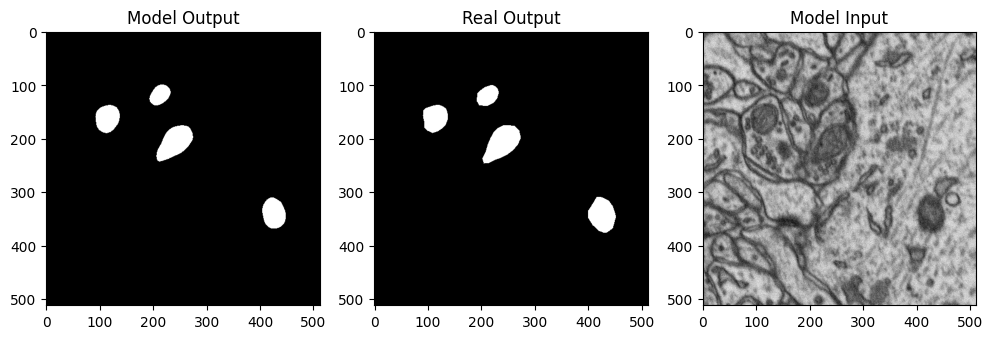

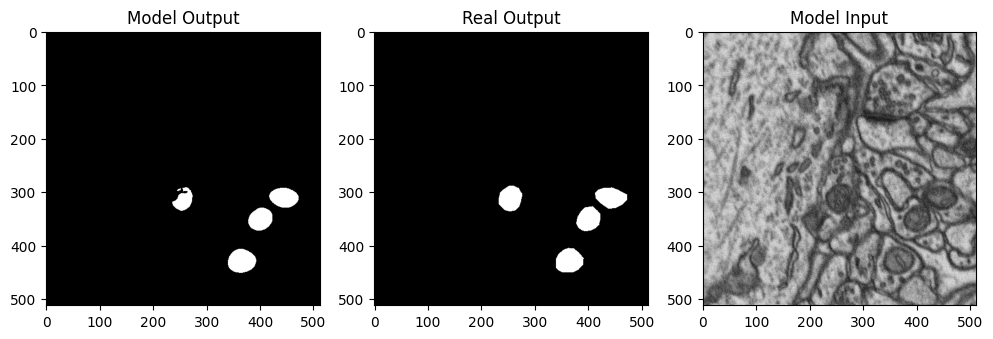

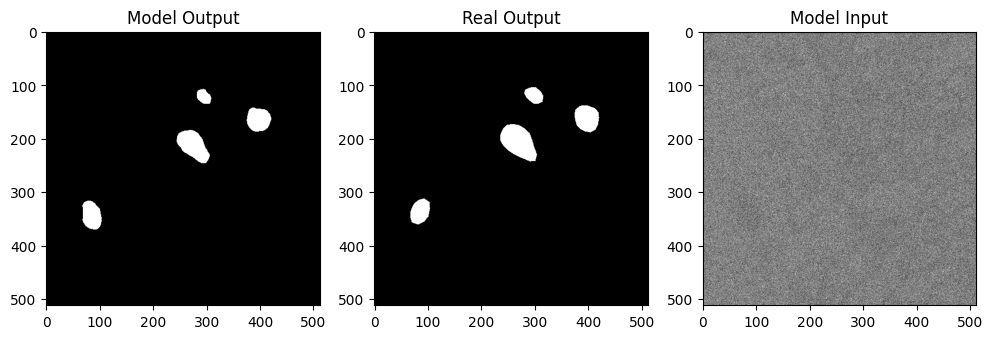

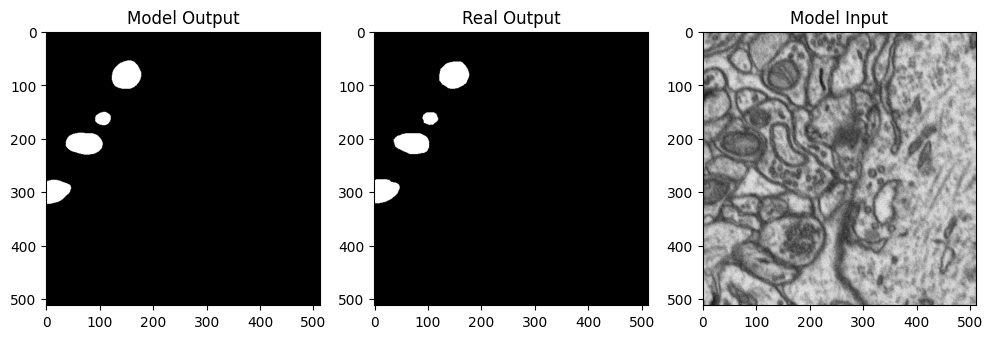

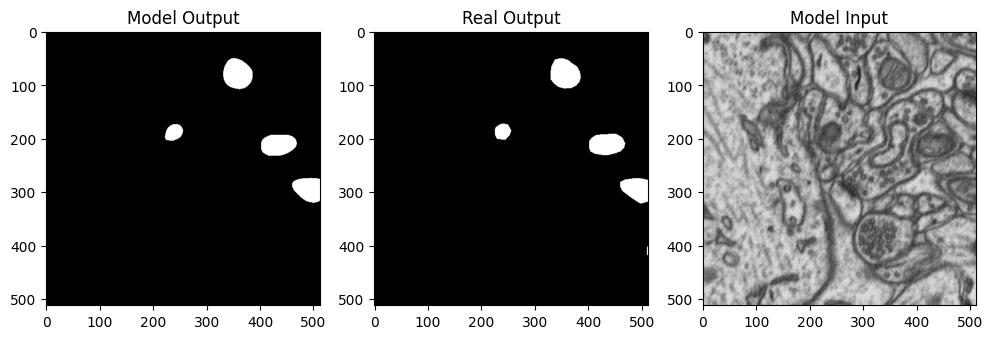

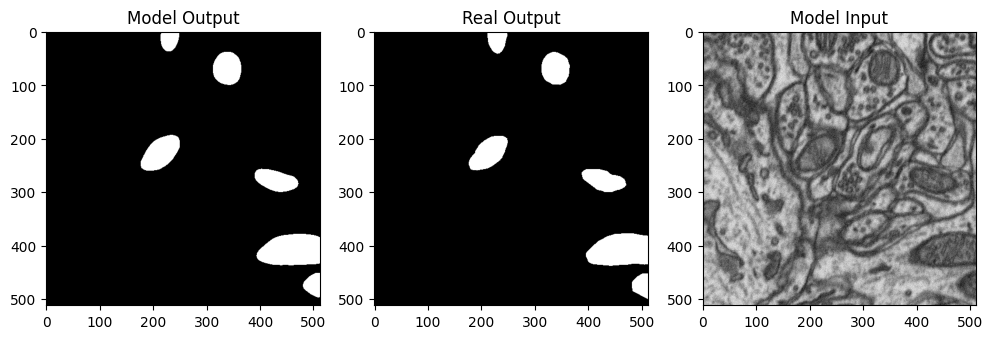

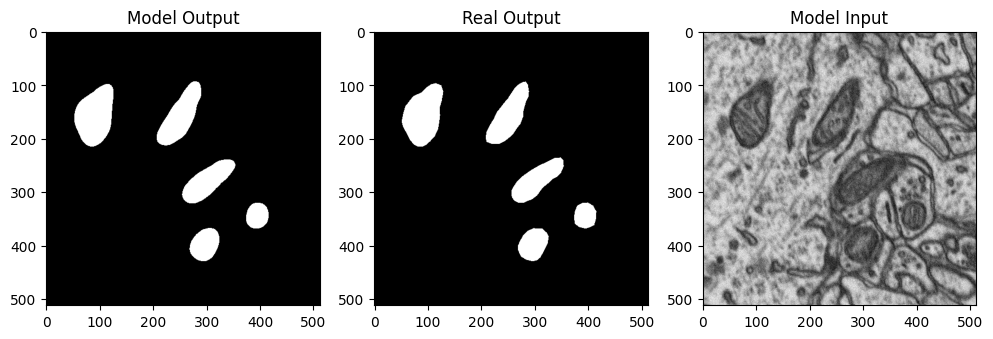

In [ ]:
with torch.no_grad():
# set the model in evaluation mode
  model.eval()
# loop over the validation set
  for idx, batch in enumerate(dataLoaders['val']):
  # send the input to the device
    (x, y) = (batch[0].to(device), batch[1].to(device))

    # make the predictions and calculate the validation loss
    pred = nn.Sigmoid()(model(torch.unsqueeze(x,1)))
    plt.figure(figsize=(12, 6))
    plt.subplot(131)
    plt.title("Model Output")      
    plt.imshow(((pred[0][0])).cpu().float()>0.5,cmap='gray')
    plt.subplot(132)
    plt.title("Real Output")
    plt.imshow(y[0].cpu(), cmap='gray')
    plt.subplot(133)
    plt.title("Model Input")
    plt.imshow(x[0].cpu(), cmap='gray')
    plt.show()
    
    #print(pred)
    #btcn.append(metric(pred.cpu(), torch.unsqueeze(y,1).cpu()))


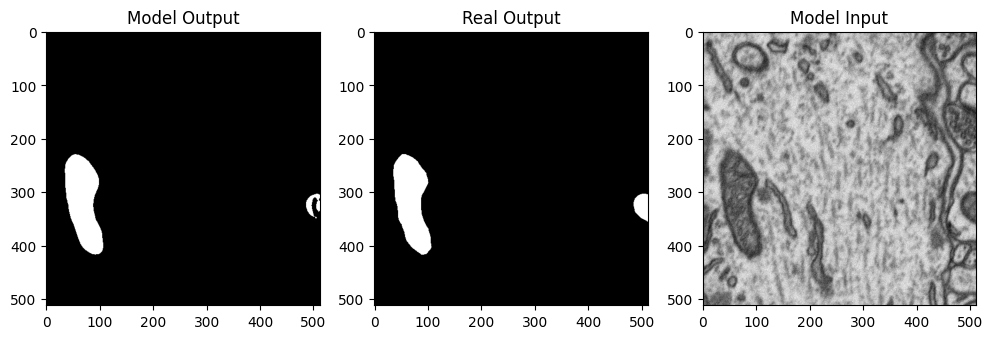

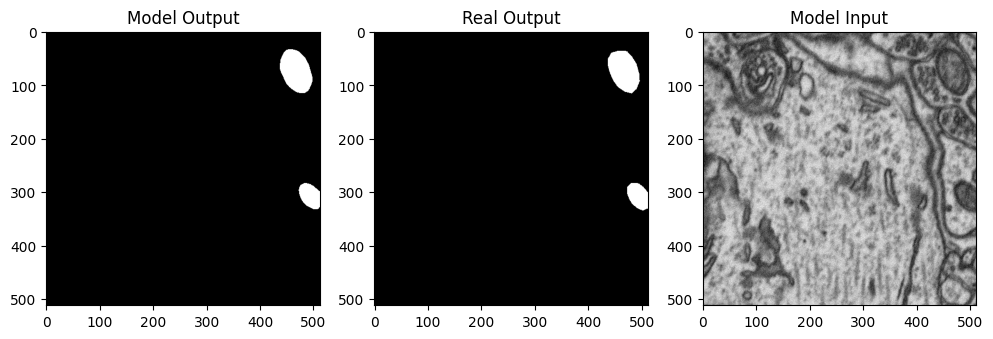

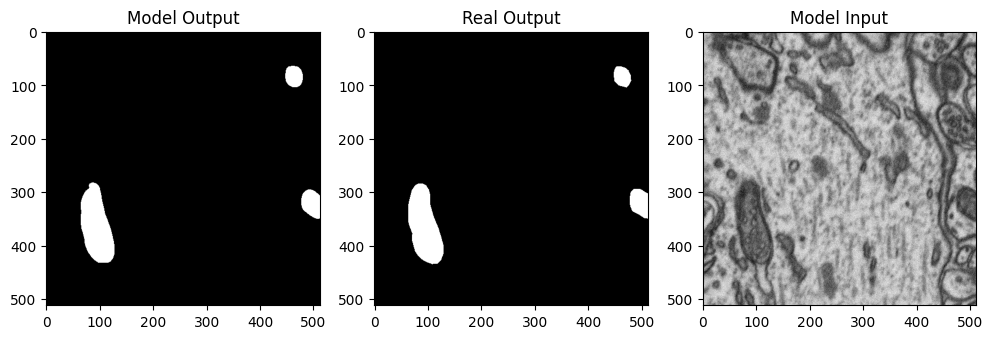

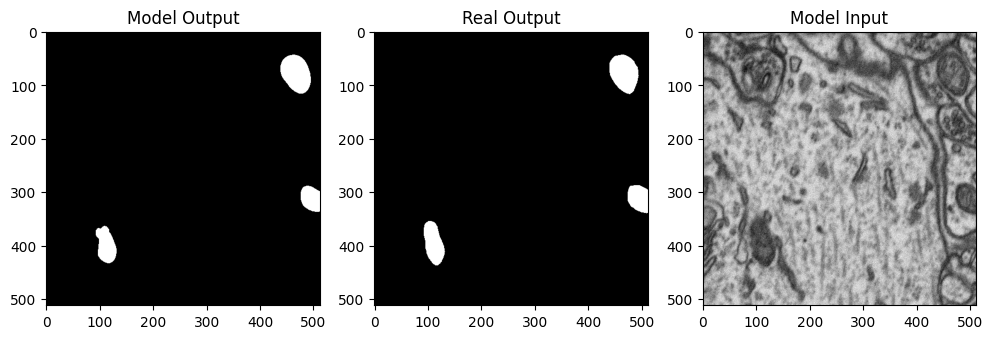

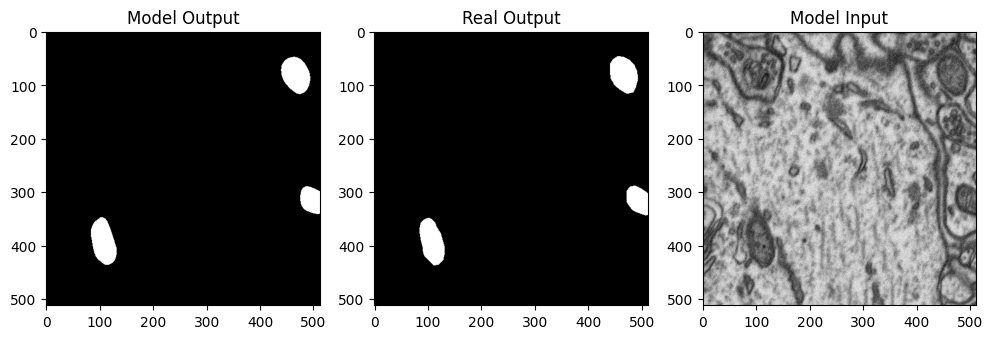

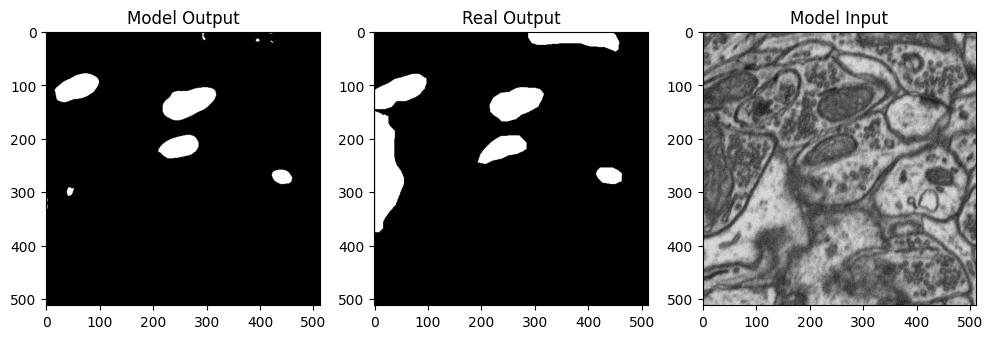

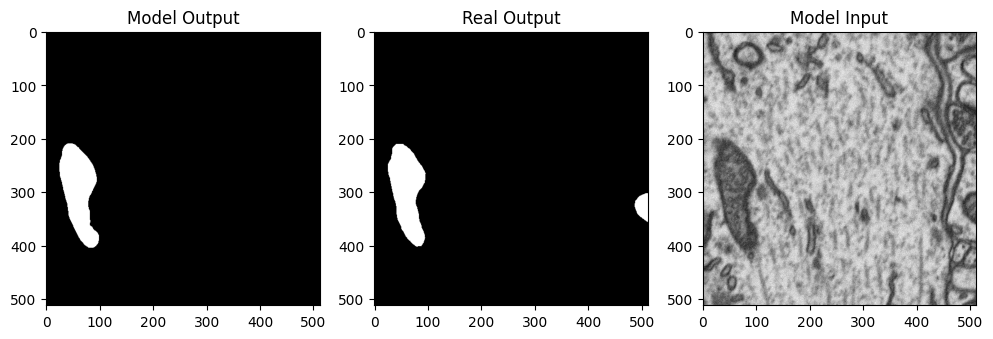

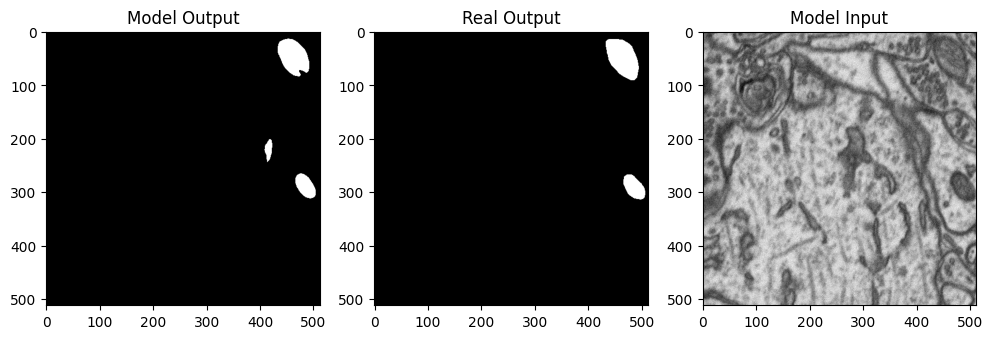

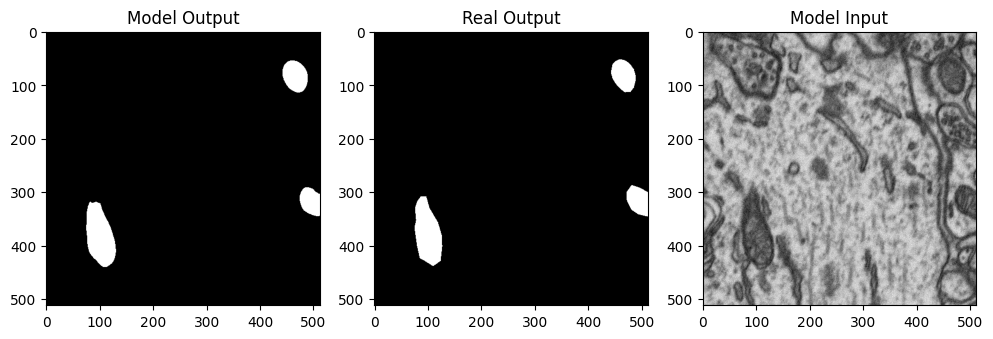

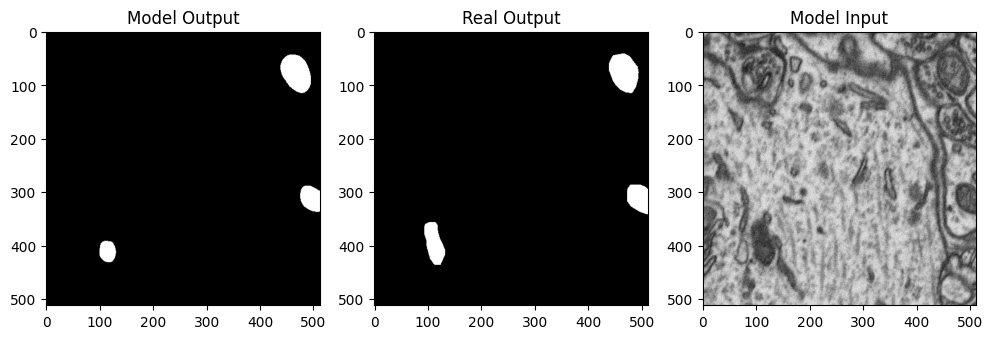

In [ ]:
with torch.no_grad():
# set the model in evaluation mode
  model.eval()
# loop over the validation set
  for idx, batch in enumerate(dataLoaders['test']):
  # send the input to the device
    (x, y) = (batch[0].to(device), batch[1].to(device))

    # make the predictions and calculate the validation loss
    pred = nn.Sigmoid()(model(torch.unsqueeze(x,1)))
    plt.figure(figsize=(12, 6))
    plt.subplot(131)
    plt.title("Model Output")      
    plt.imshow(((pred[0][0])).cpu().float()>0.5,cmap='gray')
    plt.subplot(132)
    plt.title("Real Output")
    plt.imshow(y[0].cpu(), cmap='gray')
    plt.subplot(133)
    plt.title("Model Input")
    plt.imshow(x[0].cpu(), cmap='gray')
    plt.show()
    
    
    #print(pred)
   
    #btcn.append(metric(pred.cpu(), torch.unsqueeze(y,1).cpu()))


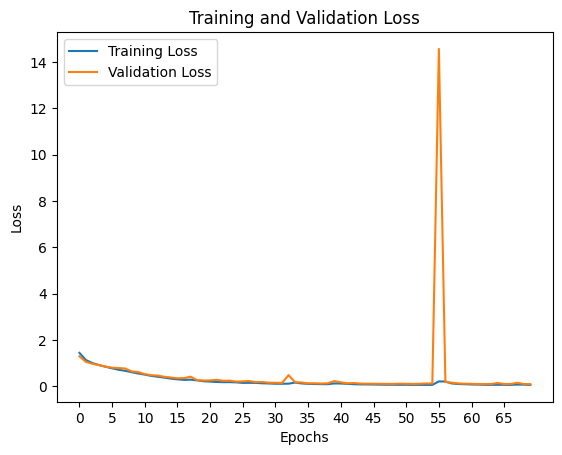

In [ ]:
epochs = range(0, 70)
 
# Add in a title and axes labels

# Plot and label the training and validation loss values
plt.plot(epochs, tlossPerEpoch, label='Training Loss')
plt.plot(epochs, vlossPerEpoch, label='Validation Loss')
 
# Add in a title and axes labels
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
 
# Set the tick locations
plt.xticks(np.arange(0, 70, 5))
 
# Display the plot
plt.legend(loc='best')
plt.show()


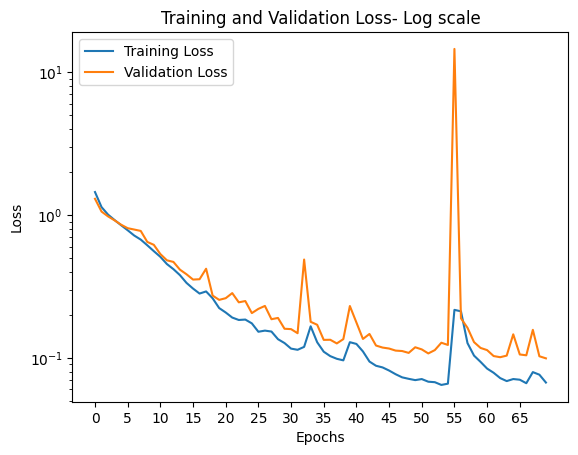

In [ ]:
epochs = range(0, 70)
 
# Add in a title and axes labels
plt.yscale('log')
# Plot and label the training and validation loss values
plt.plot(epochs, tlossPerEpoch, label='Training Loss')
plt.plot(epochs, vlossPerEpoch, label='Validation Loss')
 
# Add in a title and axes labels
plt.title('Training and Validation Loss- Log scale')
plt.xlabel('Epochs')
plt.ylabel('Loss')
 
# Set the tick locations
plt.xticks(np.arange(0, 70, 5))
 
# Display the plot
plt.legend(loc='best')
plt.show()


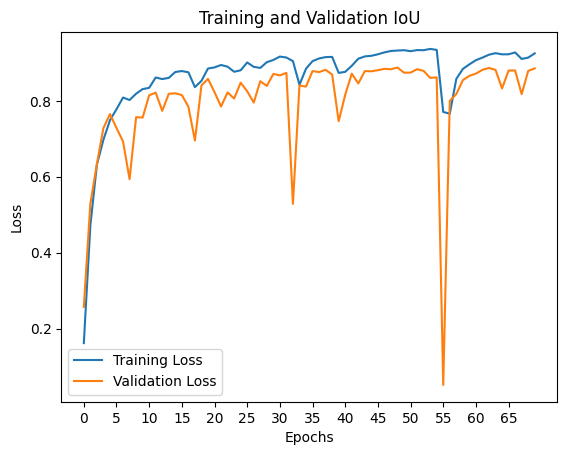

In [ ]:
epochs = range(0, 70)
 
# Plot and label the training and validation loss values
plt.plot(epochs, tIndexPerEpoch, label='Training Loss')
plt.plot(epochs, vIndexPerEpoch, label='Validation Loss')
 
# Add in a title and axes labels
plt.title('Training and Validation IoU')
plt.xlabel('Epochs')
plt.ylabel('Loss')
 
# Set the tick locations
plt.xticks(np.arange(0, 70, 5))
 
# Display the plot
plt.legend(loc='best')
plt.show()


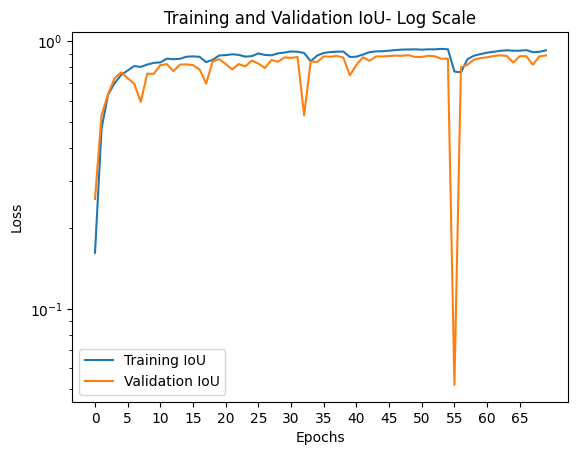

In [ ]:
epochs = range(0, 70)
plt.yscale('log')

# Plot and label the training and validation loss values
plt.plot(epochs, tIndexPerEpoch, label='Training IoU')
plt.plot(epochs, vIndexPerEpoch, label='Validation IoU')
 
# Add in a title and axes labels
plt.title('Training and Validation IoU- Log Scale')
plt.xlabel('Epochs')
plt.ylabel('Loss')
 
# Set the tick locations
plt.xticks(np.arange(0, 70, 5))
 
# Display the plot
plt.legend(loc='best')
plt.show()


In [ ]:
from pickle import load, dump
with open('./train_loss.pkl', 'wb') as file:
    dump(tlossPerEpoch, file)
 
with open('./val_loss.pkl', 'wb') as file:
    dump(vlossPerEpoch, file)

In [ ]:
for name in ['train', 'val', 'test']:
  Loss=0
  Index=0
  btc=[]
  with torch.no_grad():
    # set the model in evaluation mode
      model.eval()
    # loop over the validation set
      for idx, batch in enumerate(dataLoaders[name]):
      # send the input to the device
        x=batch[0].to(device)
        y=batch[1].to(device)
        # make the predictions and calculate the validation loss
        x=torch.unsqueeze(x,1)
        pred = model(x)
        y=torch.unsqueeze(y,1)
        Loss += loss(pred, y).detach()
        btc.append(metric(((nn.Sigmoid()(pred).cpu())), y.cpu()))        
  Loss=(valLoss.item()/len(dataLoaders[name]))
  Index=(np.mean(btc))
  print(name, ":- Loss", Loss,":- IoU ", Index)

train :- Loss 0.16439881469264175 :- IoU  0.93432283
val :- Loss 0.6781451106071472 :- IoU  0.88113946
test :- Loss 0.5425160884857178 :- IoU  0.70885813
